## Plotting

<a name="toc"></a>
### Table of Contents
1. [Functions](#functions)
    - [setup](#setup)
    - [run exact](#exact)
    - [run tsh](#tsh)
    - [plot panel](#panel1)
2. [Models](#models)
    - [Model I](#model1)
    - [Model II](#model2)
    - [Model III](#model3)    

<a name="functions"></a>
<a name="setup"></a>
## Functions
### Setup

In [16]:
import sys
import cmath
import math
import os
import h5py
import matplotlib.pyplot as plt   # plots
import numpy as np
import time
import warnings
import random


if sys.platform=="cygwin":
    from cyglibra_core import *
elif sys.platform=="linux" or sys.platform=="linux2":
    from liblibra_core import *

import util.libutil as comn
from libra_py import units
import libra_py.models.Holstein as Holstein
from libra_py import tsh
from libra_py import tsh_stat
from libra_py import data_conv
import libra_py.data_outs as data_outs
import libra_py.data_savers as data_savers
import libra_py.tsh as tsh
import libra_py.tsh_stat as tsh_stat

import libra_py.dynamics.tsh.compute as tsh_dynamics
#import libra_py.dynamics.tsh.save as save
import libra_py.dynamics.tsh.plot as tsh_dynamics_plot


import libra_py.dynamics.exact.compute as exact_dynamics
#import libra_py.dynamics.exact.save as save
import libra_py.dynamics.exact.plot as exact_dynamics_plot

from libra_py import dynamics_plotting

#from matplotlib.mlab import griddata
%matplotlib inline 

warnings.filterwarnings('ignore')

if os.path.isdir("out"):
    pass
else:
    os.system("mkdir out")

In [17]:
colors = {}

colors.update({"11": "#8b1a0e"})  # red       
colors.update({"12": "#FF4500"})  # orangered 
colors.update({"13": "#B22222"})  # firebrick 
colors.update({"14": "#DC143C"})  # crimson   

colors.update({"21": "#5e9c36"})  # green
colors.update({"22": "#006400"})  # darkgreen  
colors.update({"23": "#228B22"})  # forestgreen
colors.update({"24": "#808000"})  # olive      

colors.update({"31": "#8A2BE2"})  # blueviolet
colors.update({"32": "#00008B"})  # darkblue  

colors.update({"41": "#2F4F4F"})  # darkslategray
colors.update({"42": "#000080"})  # navy blue

clrs_index = ["11", "21", "31", "41", "12", "22", "32", "13","23", "14", "24", "42"]

In [18]:
def compute_model(q, params, full_id):

    model = params["model"]
    res = None
    
    if model==1:        
        res = Holstein.Holstein2(q, params, full_id)
    elif model==2:
        res = Holstein.Holstein3(q, params, full_id)
    elif model==3:
        res = Holstein.Holstein4(q, params, full_id)
        
    return res


def potential(q, params):
    """
    Thin wrapper of the model Hamiltonians that can be used in 
    the fully-quantum calculations
    """

    # Diabatic properties
    obj = compute_model(q, params, Py2Cpp_int([0,0]))
    
    # Adiabatic properties
    nadi = len(params["E_n"])
    ndof = 1
    ham = nHamiltonian(nadi, nadi, ndof) # ndia, nadi, nnucl
    ham.init_all(2)
        

    ham.compute_diabatic(compute_model, q, params)    
    ham.compute_adiabatic(1);   
    
    
    obj.ham_adi = ham.get_ham_adi()    
    obj.dc1_adi = CMATRIXList() 
    
    for n in range(ndof):    
        x = ham.get_dc1_adi(n)
        for i in range(nadi):
            for j in range(nadi):
                if i!=j:
                    #pass
                    if math.fabs(x.get(i,j).real)>1e+10:
                        x.set(i,j, 0.0+0.0j)                    
                        x.set(j,i, 0.0+0.0j)
                        
        obj.dc1_adi.append( x )    
    
    
    return obj

<a name="exact"></a>
[Return to table of contents](#toc)

Here, we wrap default parameters into a function to run the exact dynamics by calling the Libra function `exact_dynamics.run_relaxation`. Plotting is also wrapped in this function, but it is commented out as all plotting will be condensed into a single function shown later.

In [19]:
def run_exact(common_params, model_params, prefix, rmin=[-15], rmax=[15]):
    """
    To run calculations and to plot the results
    """
    #=========== Run the dynamics =============
    params = dict(common_params)
    
    properties_to_save = [ "timestep", "time", "pop_adi" ] 


    # Here, we do really mean to override the variables
    params.update( { "progress_frequency":0.1, "rmin":rmin, "rmax":rmax, "dx":[0.1],                
                     "integrator":"SOFT",          
                     "prefix":prefix, 
                     "hdf5_output_level":-1, "use_compression":0, "compression_level":[0,0,0], 
                     "mem_output_level":2, "txt_output_level":0, "properties_to_save": properties_to_save,
                     "custom_pops":[]                    
                  } )    
    
    
    res = exact_dynamics.run_relaxation( params, potential, model_params )

    
    #=========== Plot the results =============    
    which_adi = params["which_adi_states"]
    which_dia = params["which_dia_states"]
    
    plot_params = {"prefix":prefix, "filename":"mem_data.hdf", "hdf5_output_level":2,
                   "which_dofs":[0],  "which_adi_states":which_adi, "which_dia_states":which_dia,                
                   "properties_to_save": properties_to_save,
                   "colors":colors, "clrs_index":clrs_index
                  }
    
    #exact_dynamics_plot.plot_hdf5(plot_params)
    

<a name="tsh"></a>
[Return to table of contents](#toc)

Like above, the `run_tsh` is a convenient wrapper for running dynamics with Libra. This function runs trajectory surface hopping dynamics by calling the `tsh_dynamics.generic_recipe` function. Again, plotting it set up but commented out. We wrap this function further with the `run_all_tsh_cases` function which will run the three different state tracking algorithms (no state tracking, min-cost, and stochastic) subsequently for the same model parameters. 

In [20]:
def run_tsh(common_params, model_params, prefix):
    
    params = dict(common_params)
        
    
    # Random numbers generator object
    rnd = Random()
    
    #============ Initialize dynamical variables ==================
    x0 = params["x0"]
    p0 = params["p0"]
    masses = params["masses"]
    k0 = params["k"]
    ntraj = params["ntraj"]
    nstates = params["nstates"]
    
    # Nuclear
    init_nucl = {"init_type":3, "force_constant":k0, "ntraj":ntraj}
    q, p, iM = tsh_dynamics.init_nuclear_dyn_var(x0, p0, masses, init_nucl, rnd)
    
    # Electronic
    istate = params["istate"]
    istates = []
    for i in range(nstates):
        istates.append(0.0)
    istates[ istate[1] ] = 1.0    
    _init_elec = { "init_type":3, "nstates":nstates, "istates":istates, "rep":istate[0],  "ntraj":ntraj   }

    
    #============= Dynamical variables ==============


    properties_to_save = [ "timestep", "time", "SH_pop", "SH_pop_raw"]     
    
    
    dyn_params = dict(common_params)
    
    # This should update only the properties that aren't defined, but not override the existing values!
    critical_params = [  ] 
    default_params = { "rep_tdse":1, "rep_ham":0, "rep_sh":1, "rep_lz":0, "tsh_method":0,
                   "force_method":1, "nac_update_method":1, "rep_force":1,
                   "hop_acceptance_algo":20, "momenta_rescaling_algo":201,
                   "use_boltz_factor":0, "Temperature":300.0, "do_reverse":1, "vel_rescale_opt":0,
                  
                   "do_phase_correction":1, "tol":1e-3,                  
                   "state_tracking_algo":2, "MK_alpha":0.0, "MK_verbosity":0, 
                   "convergence":1, 
                                                
                   "entanglement_opt":0, "ETHD3_alpha":0.0, "ETHD3_beta":0.0, 
                   "decoherence_algo":-1,
                   "decoherence_times_type":0, "decoherence_C_param":1.0, 
                   "decoherence_eps_param":0.1, "dephasing_informed":0,
                   "instantaneous_decoherence_variant":1, "collapse_option":0,
                   "ensemble":0, "thermostat_params":{},                   
                   "hdf5_output_level":-1, "prefix":prefix, "use_compression":0, "compression_level":[0,0,0], 
                   "mem_output_level":4, "txt_output_level":0, "properties_to_save": properties_to_save
                 } 
        
    comn.check_input(dyn_params, default_params, critical_params)
        
            
    _model_params = dict(model_params)
    _model_params.update({"model0": model_params["model"] })
                                 
    res = tsh_dynamics.generic_recipe(q, p, iM, dyn_params, compute_model, _model_params, _init_elec, rnd) 


    
    #================ Plotting  =================
    which_adi = params["which_adi_states"]
    which_dia = params["which_dia_states"]
    
    plot_prms = { "prefix":prefix, "filename":"mem_data.hdf", "output_level":3,
                  "which_trajectories":range(ntraj), "which_dofs":[0],
                  "which_adi_states":which_adi, "which_dia_states":which_dia,
                  "colors":colors, "clrs_index":clrs_index
                }

    #tsh_dynamics_plot.plot_dyn(plot_prms)
    
def run_all_tsh_cases(prefix, dyn_prms, mdl_params):
    # option = ["state_tracking_algo", "do_phase_correction" ]
        
    for option in [ [0, 1], [2, 1], [33, 1]]:
        prms = dict(dyn_prms)
        prms.update( {"state_tracking_algo":option[0], "do_phase_correction":option[1] })
        model_params = dict(mdl_params)
                    
        print(F"======= Doing option: state_tracking_algo: {option[0]}, do_phase_correction: {option[1]} =========")
        run_tsh(prms, model_params, F"{prefix}-tsh-{option[0]}")       

<a name="panel1"></a>
[Return to table of contents](#toc)

Here, we define the condensed plotting function. It plots the potential energy surfaces, projections, exact dynamics, and trajectory surface hopping for all three state tracking algorithms. There is an option (`plot_params["overlay_exact"]`) to either have the exact dynamics plotted as a separate subplot (0) or be plotted with each trajectory surface hopping plot (1). The projections can be excluded (`plot_params["show_projections"] = 0`), and the legends can also be toggled on or off for each plot. 

In [50]:
def plot_panel(pes_params, plot_params):
    colors = {}

    colors.update({"11": "#8b1a0e"})  # red       
    colors.update({"12": "#FF4500"})  # orangered 
    colors.update({"13": "#B22222"})  # firebrick 
    colors.update({"14": "#DC143C"})  # crimson   

    colors.update({"21": "#5e9c36"})  # green
    colors.update({"22": "#006400"})  # darkgreen  
    colors.update({"23": "#228B22"})  # forestgreen
    colors.update({"24": "#808000"})  # olive      

    colors.update({"31": "#8A2BE2"})  # blueviolet
    colors.update({"32": "#00008B"})  # darkblue  

    colors.update({"41": "#2F4F4F"})  # darkslategray

    clrs_index = ["11", "21", "31", "41", "12", "22", "32", "13","23", "14", "24", "41"]
    
    colors_dark = {}
    colors_dark.update({"11": "#420a04"})  # red       
    colors_dark.update({"12": "#a62d00"})  # orangered 
    colors_dark.update({"13": "#5e1111"})  # firebrick 
    colors_dark.update({"14": "#9c102c"})  # crimson   

    colors_dark.update({"21": "#3c6323"})  # green
    colors_dark.update({"22": "#003600"})  # darkgreen  
    colors_dark.update({"23": "#124d12"})  # forestgreen
    colors_dark.update({"24": "#4d4d00"})  # olive      

    colors_dark.update({"31": "#481478"})  # blueviolet
    colors_dark.update({"32": "#00004a"})  # darkblue  

    colors_dark.update({"41": "#182929"})  # darkslategray


    critical_params = [  ] 
    default_params = {  "prefix":"out", "filename":"data.hdf", "hdf5_output_level":3,
                        "which_dofs":[0], "which_adi_states":[0], "which_dia_states":[0],
                        "colors":colors, "clrs_index":clrs_index,
                        "linewidth":12, "title_fontsize":54, "axis_fontsize":40,
                        "axis_width":3, "tick_fontsize":30, "tick_width":4,
                        "tick_length":8, "legend_fontsize":30, "legend_pes":1,
                        "legend_proj":1, "legend_pop":1,
                        "overlay_exact":0, "show_projections":1,
                        "properties_to_save": 
                          [ "timestep", "time", "Ekin_dia", "Ekin_adi", "Epot_dia", 
                            "Epot_adi", "Etot_dia", "Etot_adi", "norm_dia", "norm_adi",
                            "pop_dia", "pop_adi", "q_dia", "q_adi", "q2_dia", "q2_adi", 
                            "p_dia", "p_adi", "p2_dia", "p2_adi",
                            "denmat_dia", "denmat_adi", 
                            "PSI_dia", "PSI_adi", "reciPSI_dia", "reciPSI_adi" ],
                        "ylim_pop":None
                     }
    comn.check_input(plot_params, default_params, critical_params)
        
            
    filename = plot_params["filename"]
    prefix_out = plot_params["prefix_out"]
    prefix_tsh0 = plot_params["prefix_tsh0"]
    prefix_tsh1 = plot_params["prefix_tsh1"]
    prefix_tsh2 = plot_params["prefix_tsh2"]
    prefix_exact = plot_params["prefix_exact"]
    nstates = plot_params["nstates"]
    ylim_pop = plot_params["ylim_pop"]
    
    overlay_exact = plot_params["overlay_exact"]
    show_projections = plot_params["show_projections"]
    
    hdf5_output_level = plot_params["hdf5_output_level"]   
    which_dofs = plot_params["which_dofs"]
    which_adi_states = plot_params["which_adi_states"]
    which_dia_states = plot_params["which_dia_states"]
    colors = plot_params["colors"]
    clrs_index = plot_params["clrs_index"]
    tick_fontsize =  plot_params["tick_fontsize"]
    tick_width = plot_params["tick_width"]
    tick_length = plot_params["tick_length"]
    legend_fontsize = plot_params["legend_fontsize"]
    legend_pes = plot_params["legend_pes"]
    legend_proj = plot_params["legend_proj"]
    legend_pop = plot_params["legend_pop"]
    properties_to_save = plot_params["properties_to_save"]   
    

    _compute_model = pes_params["_compute_model"]
    _param_sets = pes_params["_param_sets"]
    states_of_interest = pes_params["states_of_interest"]
    xmin = pes_params["xmin"]
    xmax = pes_params["xmax"]
    dx  = pes_params["dx"]
    xlim = pes_params["xlim"]
    ylim = pes_params["ylim"]

    plt.rcParams['axes.titlesize'] = plot_params["title_fontsize"]
    plt.rcParams['axes.labelsize'] = plot_params["axis_fontsize"]
    plt.rcParams['axes.linewidth'] = plot_params["axis_width"]
    plt.rcParams['lines.linewidth'] = plot_params["linewidth"]    
    
    # ============== Potential Energy Surface
    sz = len(_param_sets)
    X = []
    nsteps = int((xmax - xmin) / dx) + 1

    for i in range(nsteps):
        X.append(xmin + i * dx)    

    sz = len(_param_sets)
    sz1 = len(states_of_interest)
    for iset in range(sz):
               
        # The "nstates" field must be specified
        comn.check_input(_param_sets[iset], {}, ["nstates"])
        n = _param_sets[iset]["nstates"]
        
        ham = nHamiltonian(n, n, 1) # ndia, nadi, nnucl
        ham.init_all(2)

        
        hdia, hadi  = [], []  
        uij = []              # projecitions of the MOs onto elementary basis
    
        for k1 in range(n):
            hadi.append([])
            hdia.append([])
            uij_k1 = []
            for k2 in range(n):
                uij_k1.append([])
            uij.append(uij_k1)
                
    
        for i in range(nsteps):
                 
            q = MATRIX(1,1); q.set(0, 0, X[i])        
        
            # Diabatic properties
            ham.compute_diabatic(_compute_model, q, _param_sets[iset])
            
            # Adiabatic properties
            ham.compute_adiabatic(1);       
        
            U = ham.get_basis_transform()
            #P = U * U.H()  # population matrix
        
            for k1 in range(n):
                hadi[k1].append(ham.get_ham_adi().get(k1,k1).real)
                hdia[k1].append(ham.get_ham_dia().get(k1,k1).real)
            
                for k2 in range(n):
                    uij[k1][k2].append(U.get(k1,k2).real**2 + U.get(k1,k2).imag**2)
                    
                    
        plt.figure(figsize=(32, 12), dpi=300, frameon=False)
        plt.subplots_adjust(wspace = 0.4)       
        plt.subplot(1, 2, 1)
        ax = plt.gca()
        ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length) 
        plt.ylim(ylim[0], ylim[1])
        plt.xlim(xlim[0], xlim[1])
    
        plt.title('Diabatic PES' )
        plt.xlabel('Coordinate, a.u.')
        plt.ylabel('Energy, a.u.')
        plt.yticks([0, 0.05, 0.1])
        for k1 in states_of_interest:
            plt.plot(X, hdia[k1], label='$H_{%i%i}$' % (k1,k1), linewidth=7, color = colors[clrs_index[k1]])     
        if legend_pes:
            plt.legend(fontsize = legend_fontsize)    
    
        plt.subplot(1, 2, 2)
        ax = plt.gca()
        ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length) 
        plt.ylim(ylim[0], ylim[1])
        plt.xlim(xlim[0], xlim[1])
        plt.title('Adiabatic PES')
        plt.xlabel('Coordinate, a.u.')
        plt.ylabel('Energy, a.u.')
        plt.yticks([0, 0.05, 0.1])
        for k1 in states_of_interest:
            plt.plot(X, hadi[k1], label='$E_{%i}$' % (k1), linewidth=7, color = colors[clrs_index[k1]])     
        if legend_pes:
            plt.legend(fontsize = legend_fontsize) 
        
                        
        plt.savefig(f"{prefix_out}/panel1.png")
        plt.show()
        
        # ============== Projections
        if show_projections:
            plt.figure(figsize=(32, 12), dpi=300, frameon=False)
            for k2 in states_of_interest:
                indx = states_of_interest.index(k2)
                plt.subplot(1, sz1, 1+indx)
                ax = plt.gca()
                ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length)
                plt.xlabel('Coordinate, a.u.')
                plt.ylabel('Projection')
                plt.yticks([0, 0.5, 1.0])
                for k1 in range(n):            
                    plt.plot(X, uij[k1][k2], label='$< \psi^{dia}_{%i} | \psi^{adi}_{%i} >$' % (k1, k2), 
                             linewidth=7, color = colors[clrs_index[k1]])    
                    if legend_proj:
                        plt.legend(fontsize = legend_fontsize)      

            plt.savefig(f"{prefix_out}/panel2.png")
        plt.show()

        # ============== Exact
        if not overlay_exact:
            plt.figure(figsize=(32, 12), dpi=300, frameon=False)
            plt.title("Exact")
            plt.xlabel('Time, a.u.')
            plt.ylabel('Population, a.u.')   
            if ylim_pop:
                plt.ylim(ylim_pop)
            ax = plt.gca()
            ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length) 
            with h5py.File(F"{prefix_exact}/{filename}", 'r') as f:
                t = None
                if "time" in properties_to_save:                        
                    t = list(f["time/data"][:])

                if "pop_adi" in properties_to_save and t != None:
                    nstates = f["pop_adi/data"].shape[1] #.attrs['dim'][1]                        
                    for i in range(nstates):        
                        if i in which_adi_states:
                            Pi = list(f["pop_adi/data"][:, i, 0])                
                            plt.plot(t, Pi, label='$P_%i$' % (i), color = colors[clrs_index[i]])
            if legend_pop:
                plt.legend(fontsize = legend_fontsize)
            plt.savefig(f"{prefix_out}/panel3.png")
            plt.show()
        
        # ============== Trajectory Surface Hopping        
        plt.figure(figsize=(32, 12), dpi=300, frameon=False)
        plt.subplots_adjust(wspace = 0.4) 
        with h5py.File(F"{prefix_tsh0}/{filename}", 'r') as f:
            nadi = nstates
            ndia = nstates
            
            plt.subplot(1,3,1)
            ax = plt.gca()
            ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length)            
            plt.title('No State Tracking')
            plt.xlabel('Time, a.u.')
            plt.ylabel('Population, a.u.')       
            if ylim_pop:
                plt.ylim(ylim_pop)
            else:
                plt.yticks([0, 0.5, 1.0])
            
            indx = -1
            for istate in range(nadi):
                if istate in which_adi_states:
                    indx = indx + 1
                    plt.plot(f["time/data"][:], f["SH_pop_raw/data"][:, istate, 0], label=f'$P_{istate}$',
                             color = colors[clrs_index[indx] ])                 
                    if legend_pop:
                            plt.legend(fontsize = legend_fontsize)
        if overlay_exact:
            with h5py.File(F"{prefix_exact}/{filename}", 'r') as f:
                t = None
                if "time" in properties_to_save:                        
                    t = list(f["time/data"][:])

                if "pop_adi" in properties_to_save and t != None:
                    nstates = f["pop_adi/data"].shape[1] #.attrs['dim'][1]                        
                    for i in range(nstates):        
                        if i in which_adi_states:
                            Pi = list(f["pop_adi/data"][:, i, 0])                
                            plt.plot(t, Pi, label='$P_%i$' % (i), color = colors_dark[clrs_index[i]], linewidth = 6)

        with h5py.File(F"{prefix_tsh1}/{filename}", 'r') as f:
            plt.subplot(1,3,2)
            ax = plt.gca()
            ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length)            
            plt.title('Min-cost')
            plt.xlabel('Time, a.u.')
            plt.ylabel('Population, a.u.') 
            if ylim_pop:
                plt.ylim(ylim_pop)
            else:
                plt.yticks([0, 0.5, 1.0])
            
            indx = -1
            for istate in range(nadi):
                if istate in which_adi_states:
                    indx = indx + 1
                    plt.plot(f["time/data"][:], f["SH_pop_raw/data"][:, istate, 0], label=f'$P_{istate}$',
                             color = colors[clrs_index[indx] ])   
                    if legend_pop:
                            plt.legend(fontsize = legend_fontsize)    
        if overlay_exact:
            with h5py.File(F"{prefix_exact}/{filename}", 'r') as f:
                t = None
                if "time" in properties_to_save:                        
                    t = list(f["time/data"][:])

                if "pop_adi" in properties_to_save and t != None:
                    nstates = f["pop_adi/data"].shape[1] #.attrs['dim'][1]                        
                    for i in range(nstates):        
                        if i in which_adi_states:
                            Pi = list(f["pop_adi/data"][:, i, 0])                
                            plt.plot(t, Pi, label='$P_%i$' % (i), color = colors_dark[clrs_index[i]], linewidth = 6)
                            
        with h5py.File(F"{prefix_tsh2}/{filename}", 'r') as f:
            plt.subplot(1,3,3)
            ax = plt.gca()
            ax.tick_params(labelsize=tick_fontsize, width=tick_width, length=tick_length)            
            plt.title('Stochastic')
            plt.xlabel('Time, a.u.')
            plt.ylabel('Population, a.u.')  
            if ylim_pop:
                plt.ylim(ylim_pop)
            else:
                plt.yticks([0, 0.5, 1.0])
            
            indx = -1
            for istate in range(nadi):
                if istate in which_adi_states:
                    indx = indx + 1
                    plt.plot(f["time/data"][:], f["SH_pop_raw/data"][:, istate, 0], label=f'$P_{istate}$', 
                             color = colors[clrs_index[indx] ])  
                    if legend_pop:
                            plt.legend(fontsize = legend_fontsize)
        if overlay_exact:
            with h5py.File(F"{prefix_exact}/{filename}", 'r') as f:
                t = None
                if "time" in properties_to_save:                        
                    t = list(f["time/data"][:])

                if "pop_adi" in properties_to_save and t != None:
                    nstates = f["pop_adi/data"].shape[1] #.attrs['dim'][1]                        
                    for i in range(nstates):        
                        if i in which_adi_states:
                            Pi = list(f["pop_adi/data"][:, i, 0])                
                            plt.plot(t, Pi, label='$P_%i$' % (i), color = colors_dark[clrs_index[i]], linewidth = 6)
        plt.savefig(f"{prefix_out}/panel4.png")
        plt.show()

<a name="models"></a>
# Models

Now that we have our functions defined, we describe the three models used in the manuscript. Both the Hamiltonian parameters and dynamics parameters are defined here.

<a name="model1"></a>
[Return to table of contents](#toc)

## Model I
The first model is a two state system with a trivial crossing. Below we define the model parameters in `model1` and the dynamics parameters in `dyn_params1`. 

In [22]:
model1 = {"model":1,
          "E_n":[-0.001, -0.001],
           "x_n":[-1.0, 1.0],
           "k_n":[0.005, 0.005],
           "V":0.0,
           "nstates":2}

dyn_params1 = { "nsteps":1000, "dt":10, 
                  "ntraj":250, "x0":[-4.0], "p0":[2.0], "masses":[2000.0], "k":[0.005],                  
                  "nstates":2, "istate":[1, 0],
                  "which_adi_states":range(2), "which_dia_states":range(2)
                } 

We run the exact dynamics using the wrapper function defined above.

In [23]:
run_exact(dyn_params1, model1, "out/1")

ncustom_pops = 0
Run calculations with the dynamical parameters  {'nsteps': 1000, 'dt': 10, 'ntraj': 250, 'x0': [-4.0], 'p0': [2.0], 'masses': [2000.0], 'k': [0.005], 'nstates': 2, 'istate': [1, 0], 'which_adi_states': range(0, 2), 'which_dia_states': range(0, 2), 'progress_frequency': 0.1, 'rmin': [-15], 'rmax': [15], 'dx': [0.1], 'integrator': 'SOFT', 'prefix': 'out/1', 'hdf5_output_level': -1, 'use_compression': 0, 'compression_level': [0, 0, 0], 'mem_output_level': 2, 'txt_output_level': 0, 'properties_to_save': ['timestep', 'time', 'pop_adi'], 'custom_pops': []}
Run calculations with the model parameters  {'model': 1, 'E_n': [-0.001, -0.001], 'x_n': [-1.0, 1.0], 'k_n': [0.005, 0.005], 'V': 0.0, 'nstates': 2}
Norm (dia) =  1.0
Norm (adi) =  1.0
Ekin (dia) =  0.0013952847075210481
Ekin (adi) =  0.001395284707521047
Epot (dia) =  0.021895284707521057
Epot (adi) =  0.021895284707521057
 step= 0
 step= 100
 step= 200
 step= 300
 step= 400
 step= 500
 step= 600
 step= 700
 step= 800
 st

Next, we run the trajectory surface hopping dynamics for all three state tracking algorithms using the wrapper function defined previously. 

In [24]:
run_all_tsh_cases("out/1", dyn_params1, model1) 

======= Doing option: state_tracking_algo: 0, do_phase_correction: 1 =========
 step= 0
 step= 100
 step= 200
 step= 300
 step= 400
 step= 500
 step= 600
 step= 700
 step= 800
 step= 900
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'SH_pop', 'SH_pop_raw']
keywords =  ['timestep', 'time', 'SH_pop', 'SH_pop_raw', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'Etherm', 'E_NHC', 'states', 'D_adi', 'D_adi_raw', 'D_dia', 'D_dia_raw', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'Etherm', 'E_NHC', 'states', 'SH_pop', 'SH_pop_raw', 'D_adi', 'D_adi_raw', 'D_dia', 'D_dia_raw', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named SH_pop/data
Saving the dataset named S

Once the dynamics is completed, we plot the potential energy surfaces, projections, exact dynamics, and TSH dynamics using the `plot_panel` function. This function requires two dictionaries for input: one to define the PES and projections, and another to define the dynamics plotting. For this model, we overlap the exact dynamics with the TSH dynamics when plotting. The thick lines correspond to the TSH dynamics and the thin, darker lines correspond to the exact dynamics. 

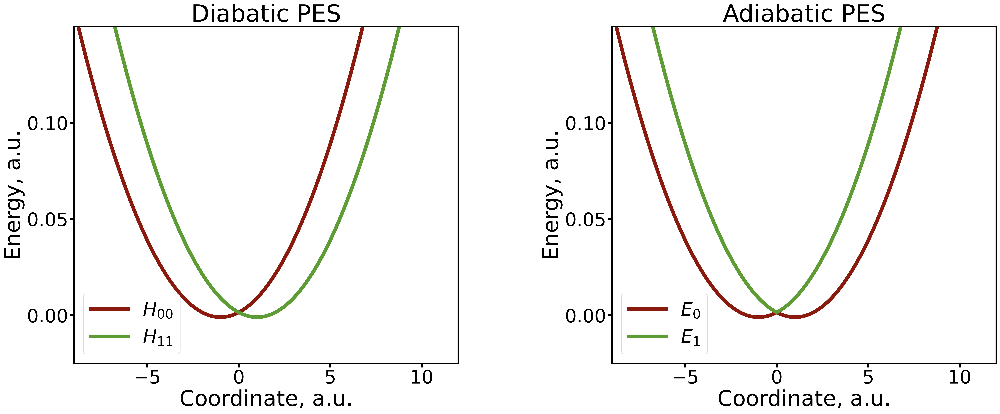

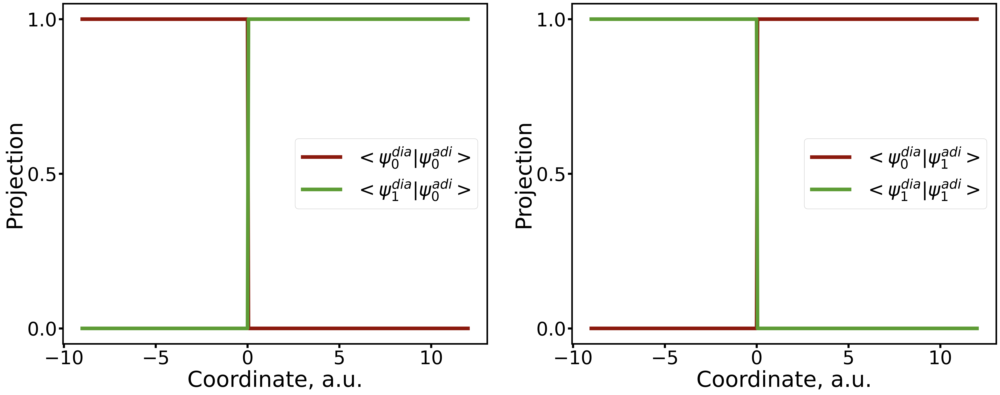

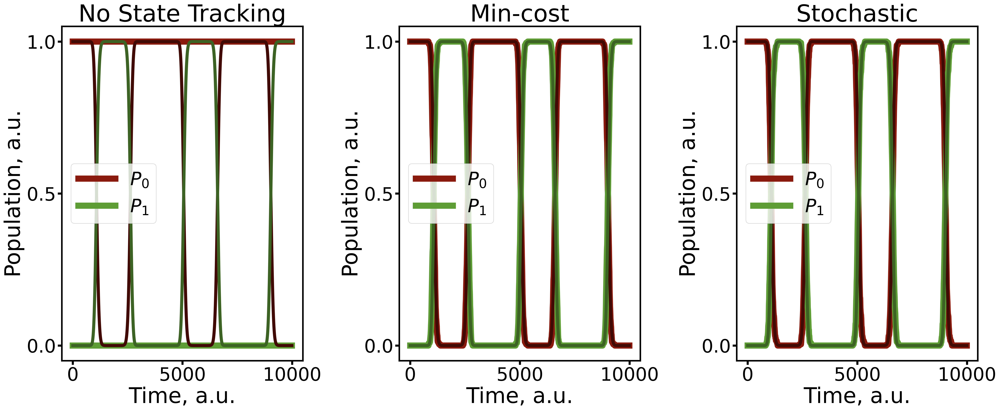

In [40]:
model_num = 1

plot_params = {"filename":"mem_data.hdf", "hdf5_output_level":2,
               "which_dofs":[0],  "which_adi_states":range(4), "which_dia_states":range(4),
               "colors":colors, "clrs_index":clrs_index, "nstates":2,
              
              "title_fontsize": 46, "legend_fontsize":36, "axis_fontsize":42, "tick_fontsize":36,
               "overlay_exact":1,
              
              "prefix_exact":f"out/{model_num}", "prefix_tsh0":f"out/{model_num}-tsh-0", 
              "prefix_tsh1":f"out/{model_num}-tsh-2", "prefix_tsh2":f"out/{model_num}-tsh-33",
              "prefix_out":f"out//{model_num}"}

pes_params = {"_compute_model": compute_model, "_param_sets":[model1]  , "states_of_interest": [0,1] ,
              "xmin": -9, "xmax": 12, "dx": 0.05, "ylim":[-0.025, 0.15], "xlim":[-9, 12]   
            }

    
plot_panel(pes_params, plot_params)

<a name="model2"></a>
[Return to table of contents](#toc)
## Model II
This model features a four state system with two degenerate states and all states crossing at x = 0.

In [28]:
couplings2 = [ [0.000, 0.001, 0.001, 0.002],
               [0.001, 0.000, 0.002, 0.001],
               [0.001, 0.002, 0.000, 0.001],
               [0.002, 0.001, 0.001, 0.000] 
            ]

model2 = {"model":3,
                "E_n":[0.00, 0.00, -0.005, -0.016],
                "x_n":[-2.0, -2.0, 2.0, 3.0],
                "k_n":[0.0005, 0.0005, 0.002, 0.003],
                "V":couplings2,
                "nstates":4 }

dyn_params2 = { "nsteps":1000, "dt":10, 
                  "ntraj":500, "x0":[-5.0], "p0":[0.0], "masses":[2000.0], "k":[0.005],                  
                  "nstates":4, "istate":[1, 2],
                  "which_adi_states":range(4), "which_dia_states":range(4)
                } 

In [29]:
run_exact(dyn_params2, model2, "out/2")

ncustom_pops = 0
Run calculations with the dynamical parameters  {'nsteps': 1000, 'dt': 10, 'ntraj': 500, 'x0': [-5.0], 'p0': [0.0], 'masses': [2000.0], 'k': [0.005], 'nstates': 4, 'istate': [1, 2], 'which_adi_states': range(0, 4), 'which_dia_states': range(0, 4), 'progress_frequency': 0.1, 'rmin': [-15], 'rmax': [15], 'dx': [0.1], 'integrator': 'SOFT', 'prefix': 'out/2', 'hdf5_output_level': -1, 'use_compression': 0, 'compression_level': [0, 0, 0], 'mem_output_level': 2, 'txt_output_level': 0, 'properties_to_save': ['timestep', 'time', 'pop_adi'], 'custom_pops': []}
Run calculations with the model parameters  {'model': 3, 'E_n': [0.0, 0.0, -0.005, -0.016], 'x_n': [-2.0, -2.0, 2.0, 3.0], 'k_n': [0.0005, 0.0005, 0.002, 0.003], 'V': [[0.0, 0.001, 0.001, 0.002], [0.001, 0.0, 0.002, 0.001], [0.001, 0.002, 0.0, 0.001], [0.002, 0.001, 0.001, 0.0]], 'nstates': 4}
Norm (dia) =  1.0000000000000002
Norm (adi) =  1.0000000000000002
Ekin (dia) =  0.00039537552945372316
Ekin (adi) =  0.000395284707

In [30]:
run_all_tsh_cases("out/2", dyn_params2, model2) 

======= Doing option: state_tracking_algo: 0, do_phase_correction: 1 =========
 step= 0
 step= 100
 step= 200
 step= 300
 step= 400
 step= 500
 step= 600
 step= 700
 step= 800
 step= 900
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'SH_pop', 'SH_pop_raw']
keywords =  ['timestep', 'time', 'SH_pop', 'SH_pop_raw', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'Etherm', 'E_NHC', 'states', 'D_adi', 'D_adi_raw', 'D_dia', 'D_dia_raw', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'Etherm', 'E_NHC', 'states', 'SH_pop', 'SH_pop_raw', 'D_adi', 'D_adi_raw', 'D_dia', 'D_dia_raw', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named SH_pop/data
Saving the dataset named S

For this model, we plot the exact dynamics separately. 

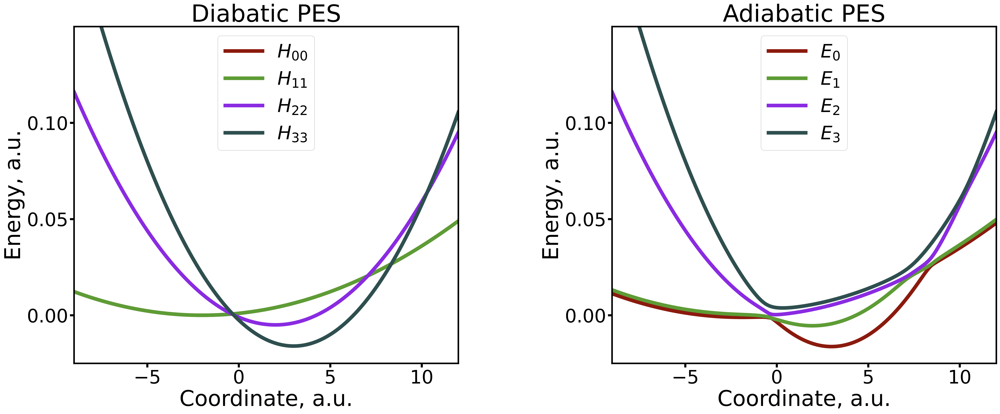

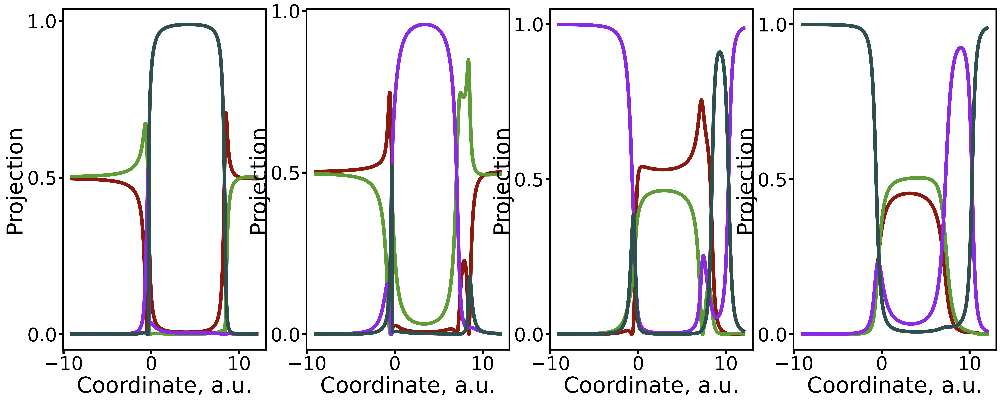

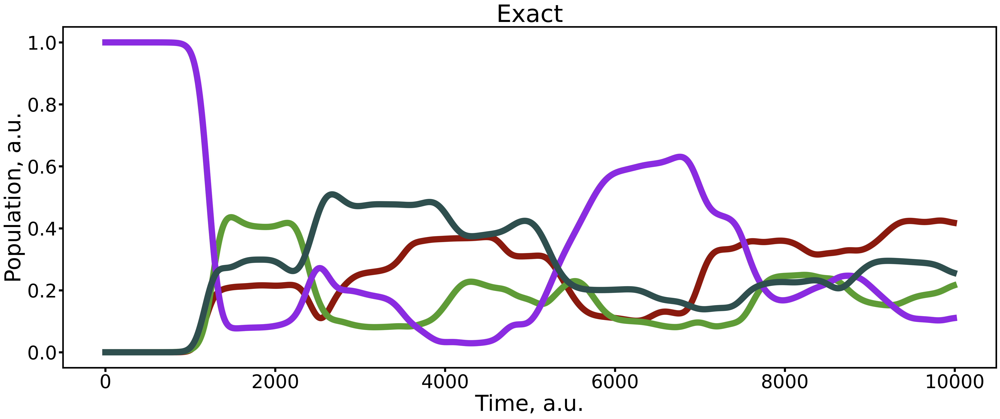

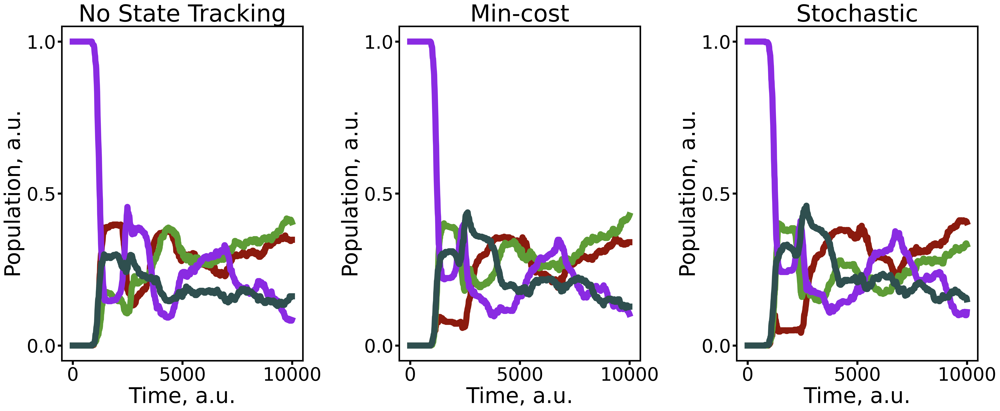

In [38]:
model_num = 2

plot_params = {"filename":"mem_data.hdf", "hdf5_output_level":2,
               "which_dofs":[0],  "which_adi_states":range(4), "which_dia_states":range(4),
               "colors":colors, "clrs_index":clrs_index, "nstates":4,

              "title_fontsize": 46, "legend_fontsize":36, "axis_fontsize":42, "tick_fontsize":36, "legend_proj":0,
               "legend_pop":0, "overlay_exact":0, 
              
              "prefix_exact":f"out/{model_num}", "prefix_tsh0":f"out/{model_num}-tsh-0", 
              "prefix_tsh1":f"out/{model_num}-tsh-2", "prefix_tsh2":f"out/{model_num}-tsh-33",
              "prefix_out":f"out/{model_num}"}

pes_params = {"_compute_model": compute_model, "_param_sets":[model2]  , "states_of_interest": [0,1,2,3] ,
              "xmin": -9, "xmax": 12, "dx": 0.05, "ylim":[-0.025, 0.15], "xlim":[-9, 12]   
            }

    
plot_panel(pes_params, plot_params)

<a name="model3"></a>
[Return to table of contents](#toc)
## Model III

Finally, we have a 12 state system. The states are spread from 0 to 5.5 with non-zero electronic couplings between states with indices |i-j| = 1 or 2. 

In [32]:
nstates = 12

couplings1 = []
energies = []
x_n = []
k_n = []

for i in range(nstates):
    tmp = []
    for j in range(nstates):
        if j==i:
            tmp.append(0.0)
        else:
            argg = 2.0*math.pi*math.fabs(j-i)/3.0
            cs = argg # math.cos(argg )
            #tmp.append( 0.001 * cs )
            argg = math.fabs(j-i)
            
            if argg==1:
                tmp.append(0.002)
            elif argg ==2:
                tmp.append(0.001)
            else:
                tmp.append(0.00)
    
    couplings1.append(tmp)

    energies.append( -0.002 * i )
    x_n.append(0.05*i)
    k_n.append(0.002 * (1.0 + (i/12.0) )  )
    #k_n.append(0.005  )

model3 = {"model":3, "nstates":12,
                "E_n":energies, "x_n":x_n,  "k_n":k_n, "V":couplings1,
               }
    
dyn_params3 = { "nsteps":1000, "dt":10, 
                  "ntraj":200, "x0":[-8.0], "p0":[0.0], "masses":[2000.0], "k":[0.005],                  
                  "nstates":12, "istate":[1, 11], "max_number_attemps": 1000,
                  "which_adi_states":range(12), "which_dia_states":range(12),
                } 

In [33]:
run_exact(dyn_params3, model3, "out/3", rmin=[-15], rmax=[25])

ncustom_pops = 0
Run calculations with the dynamical parameters  {'nsteps': 1000, 'dt': 10, 'ntraj': 200, 'x0': [-8.0], 'p0': [0.0], 'masses': [2000.0], 'k': [0.005], 'nstates': 12, 'istate': [1, 11], 'max_number_attemps': 1000, 'which_adi_states': range(0, 12), 'which_dia_states': range(0, 12), 'progress_frequency': 0.1, 'rmin': [-15], 'rmax': [25], 'dx': [0.1], 'integrator': 'SOFT', 'prefix': 'out/3', 'hdf5_output_level': -1, 'use_compression': 0, 'compression_level': [0, 0, 0], 'mem_output_level': 2, 'txt_output_level': 0, 'properties_to_save': ['timestep', 'time', 'pop_adi'], 'custom_pops': []}
Run calculations with the model parameters  {'model': 3, 'nstates': 12, 'E_n': [-0.0, -0.002, -0.004, -0.006, -0.008, -0.01, -0.012, -0.014, -0.016, -0.018000000000000002, -0.02, -0.022], 'x_n': [0.0, 0.05, 0.1, 0.15000000000000002, 0.2, 0.25, 0.30000000000000004, 0.35000000000000003, 0.4, 0.45, 0.5, 0.55], 'k_n': [0.002, 0.0021666666666666666, 0.0023333333333333335, 0.0025, 0.00266666666666

In [34]:
run_all_tsh_cases("out/3", dyn_params3, model3) 

======= Doing option: state_tracking_algo: 0, do_phase_correction: 1 =========
 step= 0
 step= 100
 step= 200
 step= 300
 step= 400
 step= 500
 step= 600
 step= 700
 step= 800
 step= 900
In mem_saver.save_data()
data_name =  ['timestep', 'time', 'SH_pop', 'SH_pop_raw']
keywords =  ['timestep', 'time', 'SH_pop', 'SH_pop_raw', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'Etherm', 'E_NHC', 'states', 'D_adi', 'D_adi_raw', 'D_dia', 'D_dia_raw', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector']
keys =  dict_keys(['timestep', 'time', 'Ekin_ave', 'Epot_ave', 'Etot_ave', 'dEkin_ave', 'dEpot_ave', 'dEtot_ave', 'Etherm', 'E_NHC', 'states', 'SH_pop', 'SH_pop_raw', 'D_adi', 'D_adi_raw', 'D_dia', 'D_dia_raw', 'q', 'p', 'Cadi', 'Cdia', 'hvib_adi', 'hvib_dia', 'St', 'basis_transform', 'projector'])
Saving the dataset named timestep/data
Saving the dataset named time/data
Saving the dataset named SH_pop/data
Saving the dataset named S

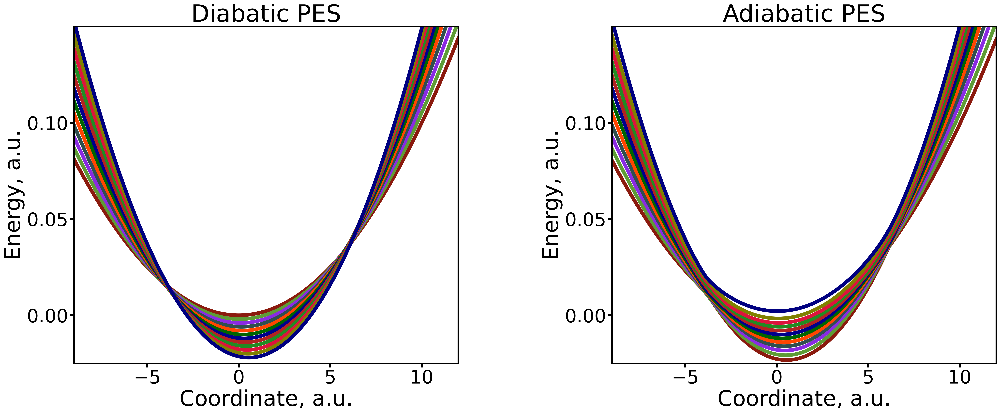

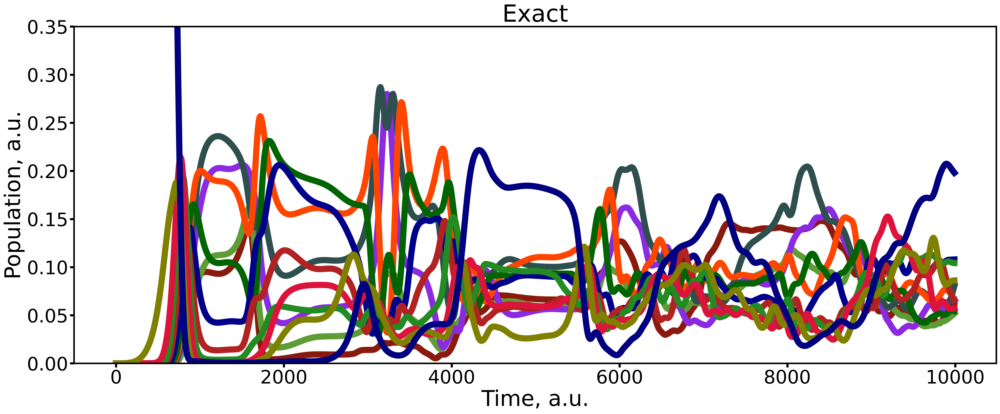

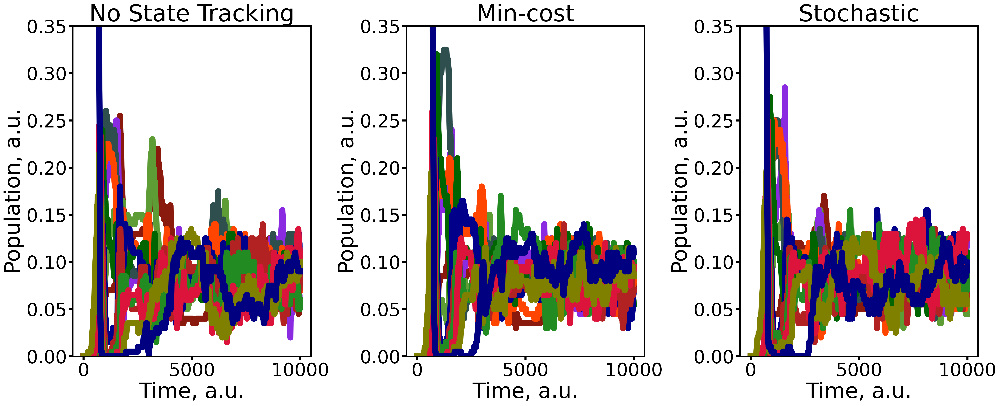

In [53]:
model_num = 3

plot_params = {"filename":"mem_data.hdf", "hdf5_output_level":2,
               "which_dofs":[0],  "which_adi_states":range(12), "which_dia_states":range(12),
               "colors":colors, "clrs_index":clrs_index, "nstates":12,

              "title_fontsize": 46, "legend_fontsize":36, "axis_fontsize":42, "tick_fontsize":36, "legend_pes":0,
               "legend_pop":0, "show_projections":0, "overlay_exact":0, "ylim_pop":(0,0.35),
              "prefix_exact":f"out/{model_num}", "prefix_tsh0":f"out/{model_num}-tsh-0", 
              "prefix_tsh1":f"out/{model_num}-tsh-2", "prefix_tsh2":f"out/{model_num}-tsh-33",
              "prefix_out":f"out/{model_num}"}

pes_params = {"_compute_model": compute_model, "_param_sets":[model3]  , "states_of_interest": range(12) ,
              "xmin": -9, "xmax": 12, "dx": 0.05, "ylim":[-0.025, 0.15], "xlim":[-9, 12]   
            }

    
plot_panel(pes_params, plot_params)

[Return to table of contents](#toc)